# Analysis of Steinmetz Neuropixels recordings of spontaneous activity in mice (Week 9-10)
Topics/Tasks included in this notebook:
- Exmanining "string" patterns in unclustered proximity matrix
- Comparison of correlation and mutual information matrices

In [8]:
using Plots, Measures; gr()
using MAT, Printf
using LinearAlgebra, Statistics, Random
using Clustering, Distances
using InformationMeasures
using BenchmarkTools

In [3]:
# Load all data in a three-element array of dictionaries
# Each element corresponding to each mouse maps variable names to their values  
mice_names = ["Krebs", "Waksman", "Robbins"]
data = [MAT.matread("./Data/$(mice_names[i])withFaces_KS2.mat") for i in 1:3];

## "String" patterns in proximity matrix

In [45]:
function heightExamine(data, id)
    hop_all = data[id]["Wh"]              # relative height of each neuron on a probe
    probe_ids = data[id]["iprobe"]        # array of corresponding probe IDs
    
    plot_array = Array{Plots.Plot{Plots.GRBackend}}(undef, 8*2)
    
    for i=1:8
        hop_iprobe = hop_all[vec(probe_ids .== i)]
        n_neuron_iprobe = length(hop_iprobe)
        rep_mat = repeat(hop_iprobe, 1, n_neuron_iprobe)
        dist_mat = abs.(rep_mat - transpose(rep_mat))
        prox_mat = 1 .- (dist_mat ./ maximum(dist_mat))
        
        plot_array[i*2-1] = heatmap(prox_mat, title="M$id-P$i", yflip=true)
        plot_array[i*2] = plot(hop_iprobe, title="M$id-P$i", xlabel="Neuron", ylabel="Height", legend=false)
    end
    
    display(plot(plot_array[1:8]..., layout=(4, 2), size=(1250, 1800), left_margin=8mm))
    display(plot(plot_array[9:16]..., layout=(4, 2), size=(1250, 1800), left_margin=8mm))
end

heightExamine (generic function with 1 method)

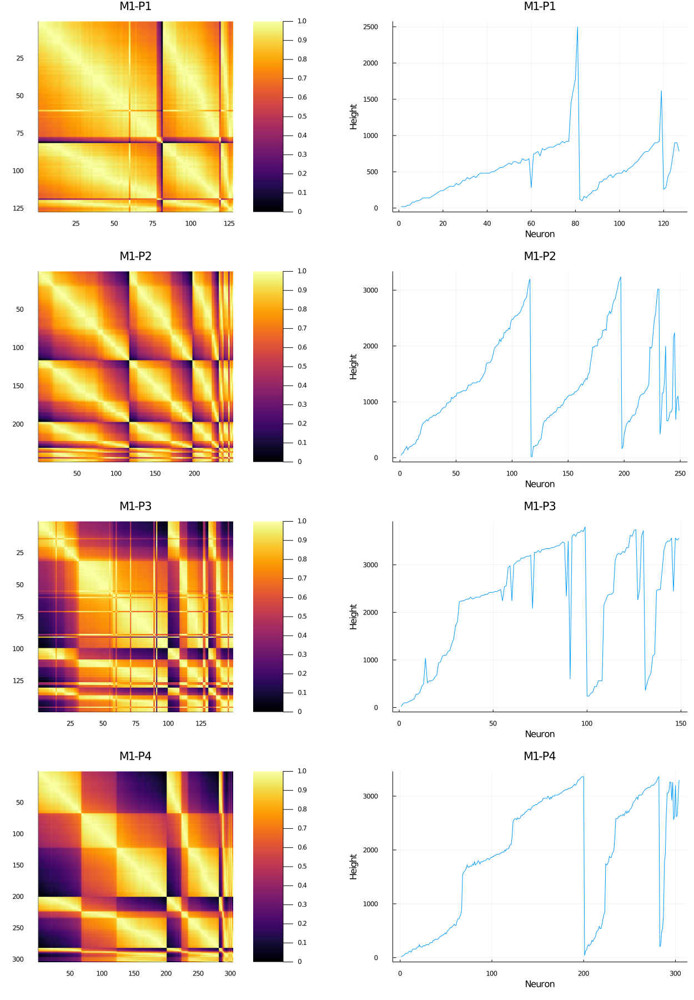

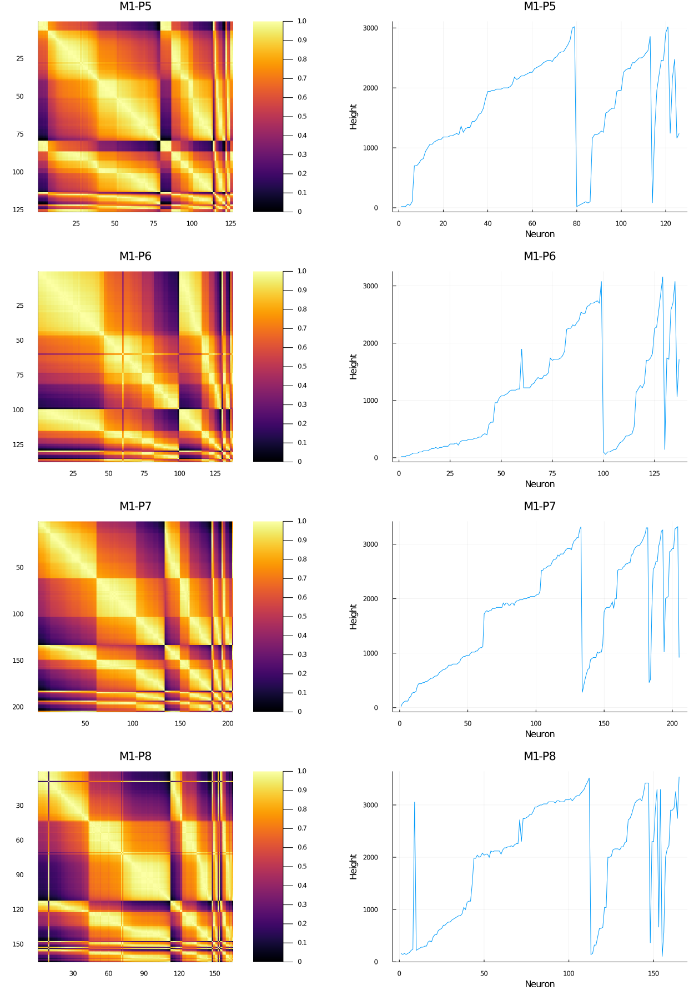

In [46]:
heightExamine(data, 1)

#### Discussion
The oscillatory behavior of the heights of neurons with respect to the neuron IDs shows why the "string" patterns exist.

## Correlation Vs Mutual Information

In [35]:
function spikeCorAnalysis(data, id, metric, link, comparison="prox", byprobe=false, clustered=false)
    st_all = data[id]["stall"]      # muti-neuron spike train matrix
    hop_all = data[id]["Wh"]        # relative height of each neuron on a probe
    
    n_neuron = size(st_all, 1)
    str = clustered ? 'C' : 'U'
    
    if byprobe
        probe_ids = data[id]["iprobe"]        # array of corresponding probe IDs
        plot_array = Array{Plots.Plot{Plots.GRBackend}}(undef, 8*2)
        
        for i=1:8
            st_iprobe = st_all[vec(probe_ids .== i), :]
            n_neuron_iprobe = size(st_iprobe, 1)
            # correlation
            cor_mat = Statistics.cor(st_iprobe, dims=2)
            if clustered
                diss_mat = Distances.pairwise(metric, cor_mat, dims=1)
                result = Clustering.hclust(diss_mat, linkage=link)
                clust_idx = result.order
            else
                clust_idx = 1:n_neuron_iprobe
            end
            
            # proximity
            if comparison == "prox"
                hop_iprobe = hop_all[vec(probe_ids .== i)]
                n_neuron_iprobe = length(hop_iprobe)
                rep_mat = repeat(hop_iprobe, 1, n_neuron_iprobe)
                dist_mat = abs.(rep_mat - transpose(rep_mat))
                compare_mat = 1 .- (dist_mat ./ maximum(dist_mat)) 
            # mutual information
            elseif comparison == "mi"
                compare_mat = zeros(n_neuron_iprobe, n_neuron_iprobe)
                for i=1:n_neuron_iprobe-1
                    for j=i+1:n_neuron_iprobe
                        compare_mat[i, j] = InformationMeasures.get_mutual_information(st_iprobe[i, :], st_iprobe[j, :])
                    end
                end

                compare_mat = compare_mat + transpose(compare_mat)

#                 for i=1:n_neuron_iprobe
#                     compare_mat[i, i] = InformationMeasures.get_entropy(st_iprobe[i, :])
#                 end
            end
            
            plot_array[i*2-1] = heatmap(cor_mat[clust_idx, clust_idx], clim=(-0.3, 1), title="M$id-P$i-cor-$str")
            plot_array[i*2] = heatmap(compare_mat[clust_idx, clust_idx], title="M$id-P$i-$comparison-$str")
        end 
        
        display(plot(plot_array[1:8]..., layout=(4, 2), size=(1250, 1800), yflip=true, left_margin=8mm))
        savefig("./plots/corVS$(comparison)_p1-4_m$(id)($str).png")
        display(plot(plot_array[9:16]..., layout=(4, 2), size=(1250, 1800), yflip=true, left_margin=8mm))
        savefig("./plots/corVS$(comparison)_p5-8_m$(id)($str).png")
    else
        # correlation
        cor_mat = Statistics.cor(st_all, dims=2)
        if clustered
            diss_mat = Distances.pairwise(metric, cor_mat, dims=1)
            result = Clustering.hclust(diss_mat, linkage=link)
            clust_idx = result.order
        else
            clust_idx = 1:n_neuron
        end
            
        # proximity
        if comparison == "prox"
            rep_mat = repeat(hop_all, 1, n_neuron)
            dist_mat = abs.(rep_mat - transpose(rep_mat))
            compare_mat = 1 .- (dist_mat ./ maximum(dist_mat))
        end
        
        p1 = heatmap(cor_mat[clust_idx, clust_idx], clim=(-0.3, 1), title="M$id-all-cor-$str")
        p2 = heatmap(compare_mat[clust_idx, clust_idx], title="M$id-all-$comparison-$str")
        
        display(plot(p1, p2, layout=(1, 2), size=(1400, 550), yflip=true))
        #savefig("./plots/corVS$(comparison)_all_m$(id)($str).png")
    end
    
end

spikeCorAnalysis (generic function with 4 methods)

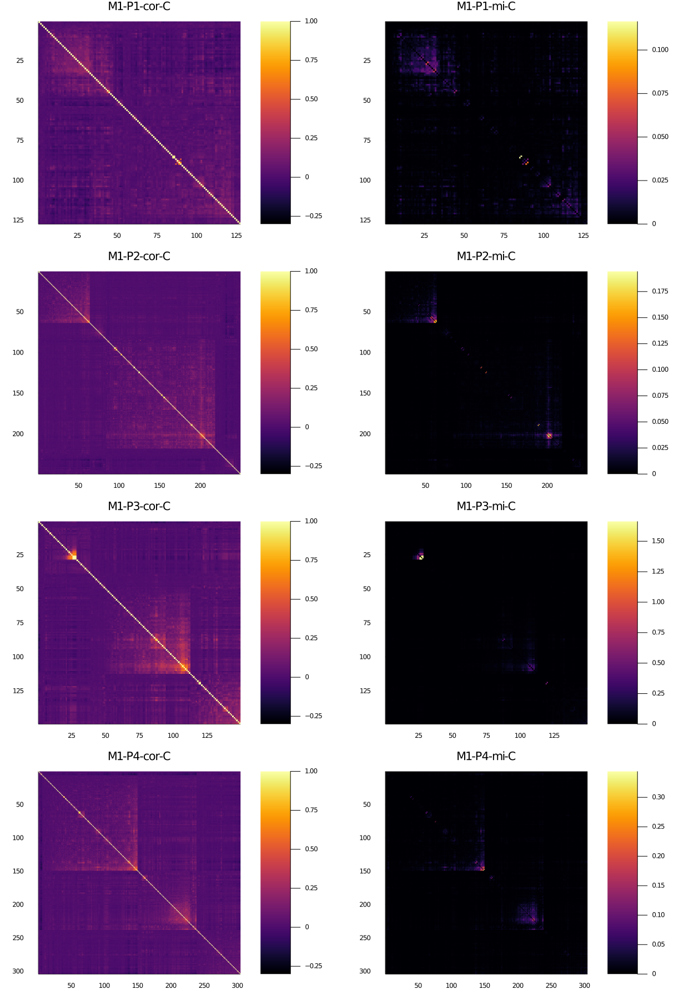

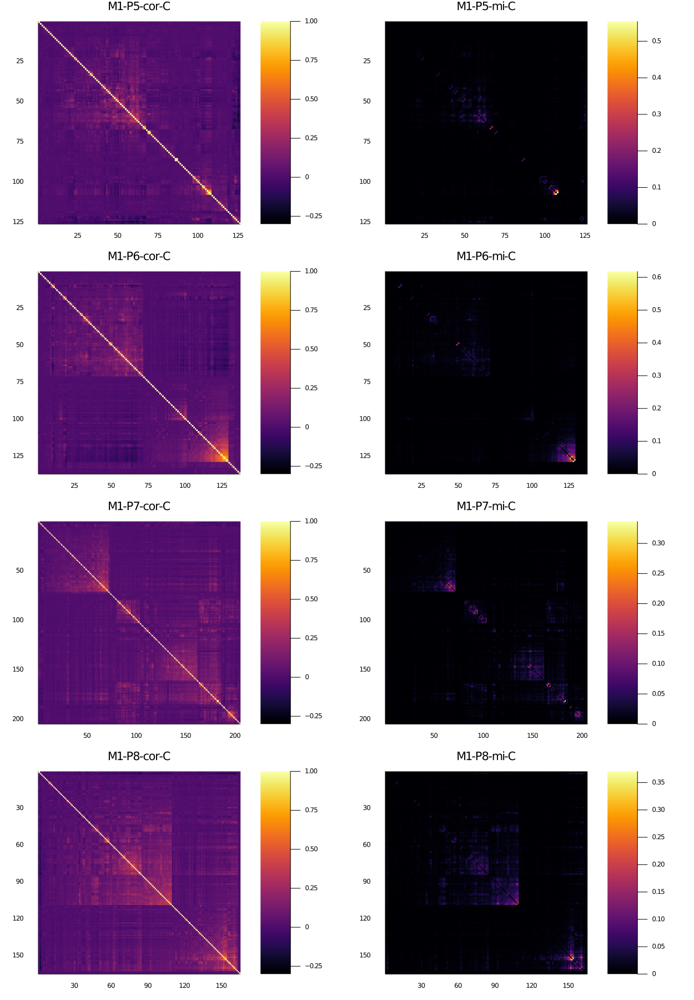

In [36]:
spikeCorAnalysis(data, 1, Distances.CosineDist(), :average, "mi", true, true)

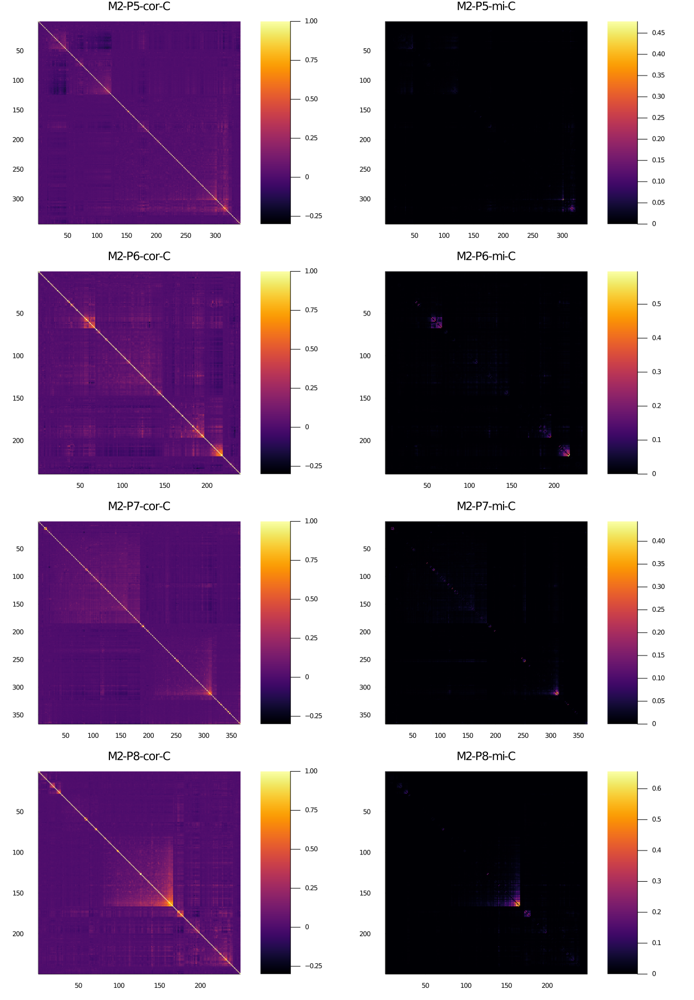

In [37]:
spikeCorAnalysis(data, 2, Distances.CosineDist(), :average, "mi", true, true)

In [41]:
spikeCorAnalysis(data, 3, Distances.CosineDist(), :average, "mi", true, true)

#### Discussion
The correspondence between the correlation and mutual information is visually evident. However, it seems that only highly correlated neurons shares information given that the heatmaps for mutual information are mostly dark area. Only the very bright patches from correlation heatmaps manifests themselves in that for mutual information. Note that the main diagonal is left as zero as the high values of "self" mutual information (entropy) reduce the visual contrast without providing meaningful insights, at least for the purpose of this analysis. 